In [1]:
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import optimize
import scipy.optimize
from scipy.optimize import minimize
from scipy.special import jv
#from scipy.ndimage import gaussian_filter1d
import sys

import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

import qgm
from qgm import image, parameter, filter, data, fitting, function

from regions import PixCoord, RectanglePixelRegion, CirclePixelRegion

cmap = image.generate_cmap(['#330000', 'r', 'w'])

In [2]:
img_trans_ave_list = []
img_trans_single_list = []

In [3]:
cmap_ferro = image.generate_cmap(['#330000', 'green', 'w'])
cmap_1Dchain = image.generate_cmap(['#330000', '#8833ff', 'w'])
cmap_Rhombic = image.generate_cmap(['#330000', '#3333dd', 'w'])
cmap_Staggered1Dchain = image.generate_cmap(['#330000', '#8d8800', 'w'])
cmap_spiral2 = image.generate_cmap(['#330000', 'orange', 'w'])
cmap_MI = image.generate_cmap(['#330000', 'gray', 'w'])
cmap_Spiral1 = image.generate_cmap(['#330000', 'r', 'w'])

# Ferro

In [4]:
date = '20221006'
dataNo = 1
scanNo = 2

In [5]:
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [6]:
param_name ='T0051: LS ramp up time  2nd (usec.)'
scan_param =scan_data[param_name]
unique_param = scan_param.unique()
flcount = scan_data['Total count @ ROI1 (arb. u.)']

In [7]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

img_flat_ave =[]
img_trans_ave = []
img_trans_list = []
for N in range(len(trans_files)):
    img_flat_ave += [np.array(Image.open(flat_files[N]))]
    img_trans_ave += [np.array(Image.open(trans_files[N]))]
img_flat_ave = np.average(img_flat_ave,axis=0)
img_trans_ave =np.average(img_trans_ave,axis=0) -img_flat_ave
for N in range(len(trans_files)):
    img_trans_list += [np.array(Image.open(trans_files[N])) - img_flat_ave]

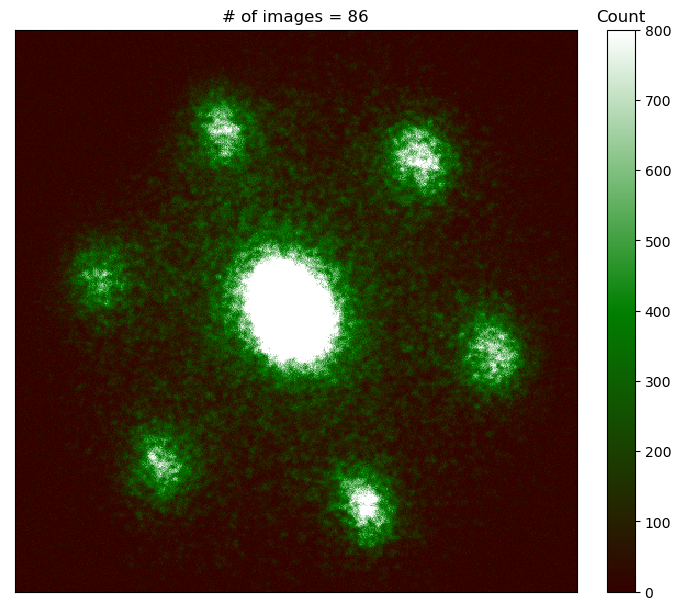

In [8]:
vmin = 0
vmax = 800
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]

fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_ave, cmap=cmap_ferro,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("# of images = %d"%(len(img_trans_list)))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

plt.savefig("Ferro_ave.png")

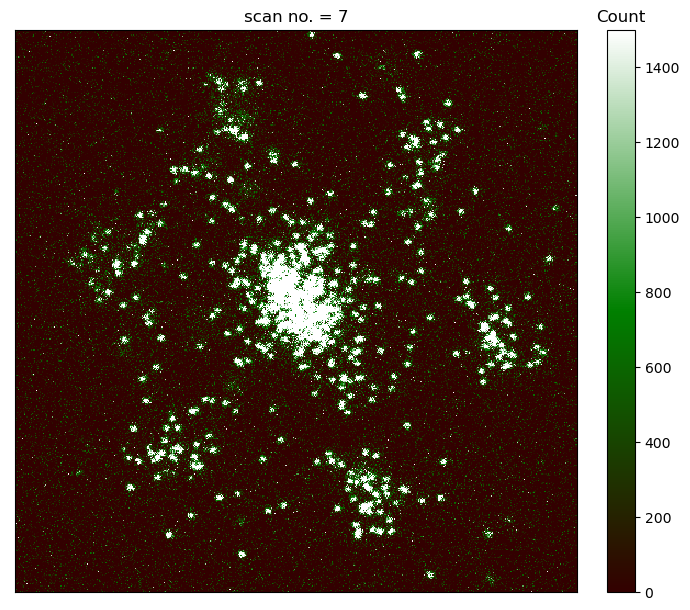

In [9]:
trans_index = 7
vmax = 1500
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]


fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_list[trans_index], cmap=cmap_ferro,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("scan no. = %d"%(trans_index))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

plt.savefig("Ferro_single.png")

In [10]:
img_trans_ave_list.append(img_trans_ave)
img_trans_single_list.append(img_trans_list[trans_index])

# 1D chain

In [11]:
dataNo = 2
scanNo = 3
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [12]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

img_flat_ave =[]
img_trans_ave = []
img_trans_list = []
for N in range(len(trans_files)):
    img_flat_ave += [np.array(Image.open(flat_files[N]))]
    img_trans_ave += [np.array(Image.open(trans_files[N]))]
img_flat_ave = np.average(img_flat_ave,axis=0)
img_trans_ave =np.average(img_trans_ave,axis=0) -img_flat_ave
for N in range(len(trans_files)):
    img_trans_list += [np.array(Image.open(trans_files[N])) - img_flat_ave]

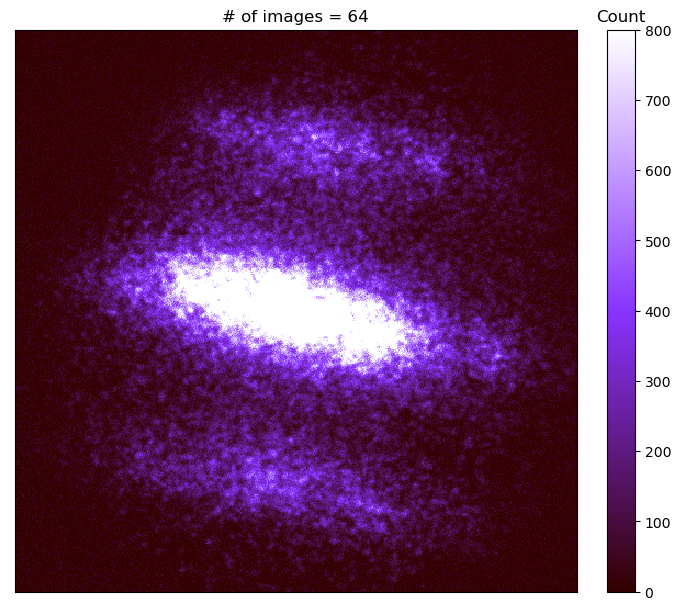

In [13]:
vmin = 0
vmax = 800
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]

fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_ave, cmap=cmap_1Dchain,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("# of images = %d"%(len(img_trans_list)))
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

plt.savefig("OneDChains_ave.png")

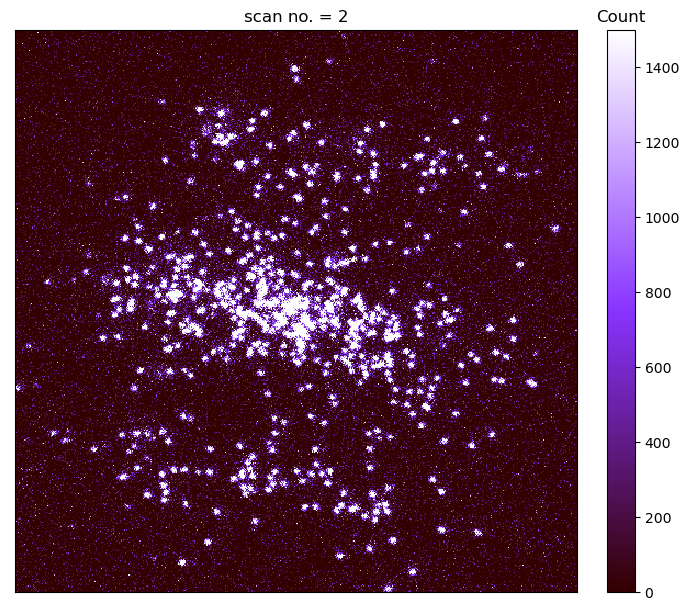

In [14]:
trans_index = 2
vmax = 1500
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]


fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_list[trans_index], cmap=cmap_1Dchain,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("scan no. = %d"%(trans_index))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

plt.savefig("OneDChains_single.png")

In [15]:
img_trans_ave_list.append(img_trans_ave)
img_trans_single_list.append(img_trans_list[trans_index])

# Rhombic

In [16]:
dataNo = 3
scanNo = 4
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [17]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

img_flat_ave =[]
img_trans_ave = []
img_trans_list = []
for N in range(len(trans_files)):
    img_flat_ave += [np.array(Image.open(flat_files[N]))]
    img_trans_ave += [np.array(Image.open(trans_files[N]))]
img_flat_ave = np.average(img_flat_ave,axis=0)
img_trans_ave =np.average(img_trans_ave,axis=0) -img_flat_ave
for N in range(len(trans_files)):
    img_trans_list += [np.array(Image.open(trans_files[N])) - img_flat_ave]

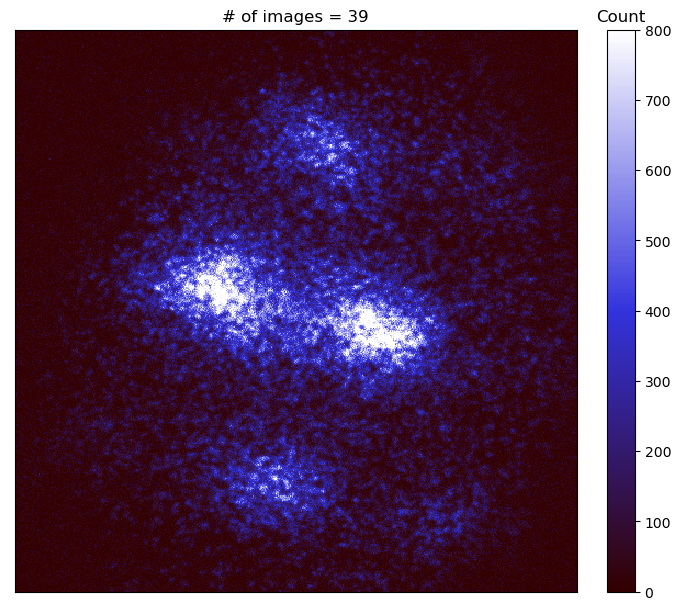

In [18]:
vmin = 0
vmax = 800
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]

fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_ave, cmap=cmap_Rhombic,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("# of images = %d"%(len(img_trans_list)))
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

plt.savefig("Rhombic_ave.png")

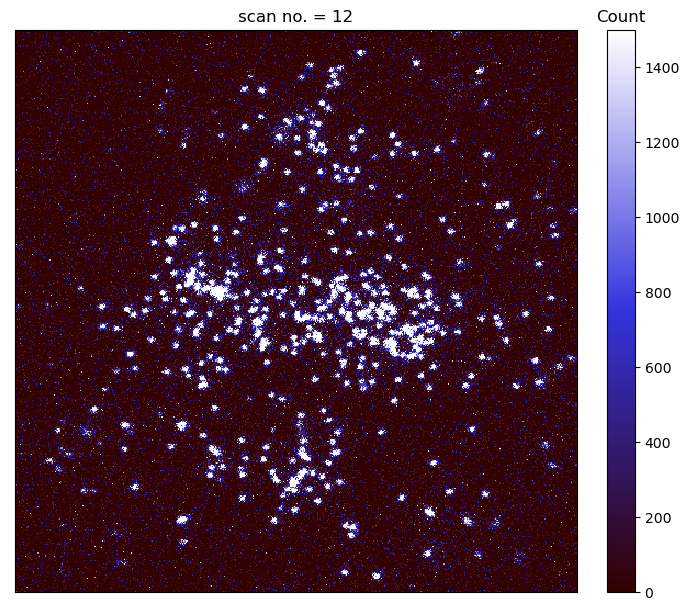

In [19]:
trans_index = 12
vmax = 1500
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]


fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_list[trans_index], cmap=cmap_Rhombic,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("scan no. = %d"%(trans_index))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

plt.savefig("output.png")

In [20]:
img_trans_ave_list.append(img_trans_ave)
img_trans_single_list.append(img_trans_list[trans_index])

# Staggered 1D chain

In [21]:
dataNo = 4
scanNo = 5
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [22]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

img_flat_ave =[]
img_trans_ave = []
img_trans_list = []
for N in range(len(trans_files)):
    img_flat_ave += [np.array(Image.open(flat_files[N]))]
    img_trans_ave += [np.array(Image.open(trans_files[N]))]
img_flat_ave = np.average(img_flat_ave,axis=0)
img_trans_ave =np.average(img_trans_ave,axis=0) -img_flat_ave
for N in range(len(trans_files)):
    img_trans_list += [np.array(Image.open(trans_files[N])) - img_flat_ave]

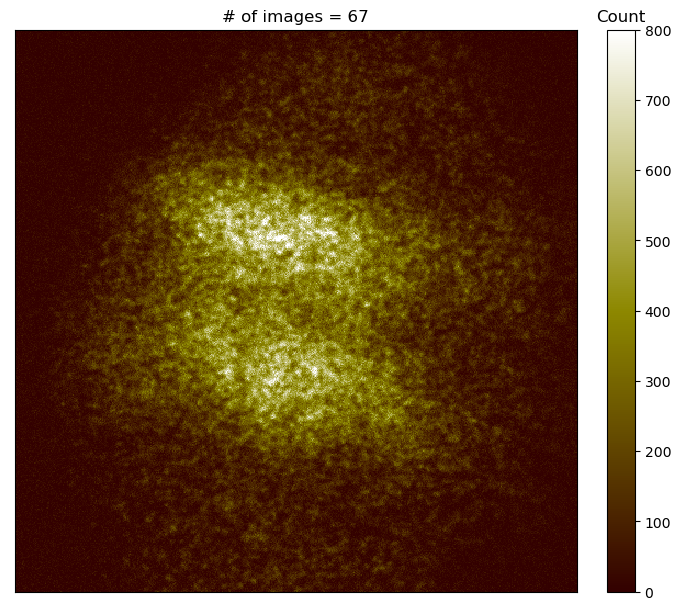

In [23]:
vmin = 0
vmax = 800
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]

fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_ave, cmap=cmap_Staggered1Dchain,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("# of images = %d"%(len(img_trans_list)))
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

plt.savefig("output.png")

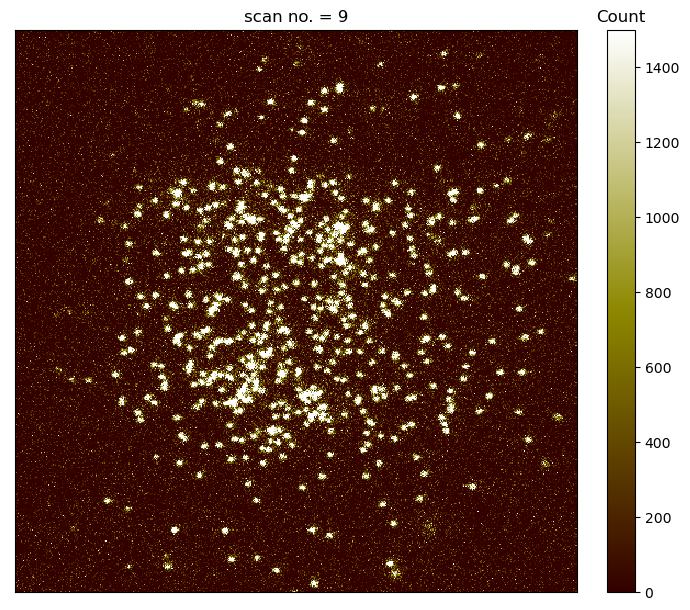

In [24]:
trans_index = 9
vmax = 1500
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]


fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_list[trans_index], cmap=cmap_Staggered1Dchain,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("scan no. = %d"%(trans_index))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

plt.savefig("output.png")

In [25]:
img_trans_ave_list.append(img_trans_ave)
img_trans_single_list.append(img_trans_list[trans_index])

# Spiral 2

In [26]:
dataNo = 9
scanNo = 10
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [27]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

img_flat_ave =[]
img_trans_ave = []
img_trans_list = []
for N in range(len(trans_files)):
    img_flat_ave += [np.array(Image.open(flat_files[N]))]
    img_trans_ave += [np.array(Image.open(trans_files[N]))]
img_flat_ave = np.average(img_flat_ave,axis=0)
img_trans_ave =np.average(img_trans_ave,axis=0) -img_flat_ave
for N in range(len(trans_files)):
    img_trans_list += [np.array(Image.open(trans_files[N])) - img_flat_ave]

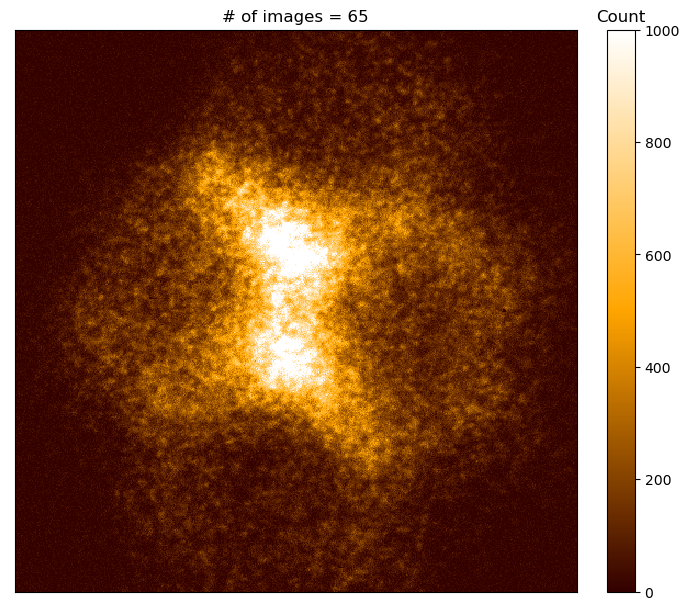

In [28]:
vmin = 0
vmax = 1000
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]

fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_ave, cmap=cmap_spiral2,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("# of images = %d"%(len(img_trans_list)))
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

plt.savefig("output.png")

Text(0.5, 1.0, 'Count')

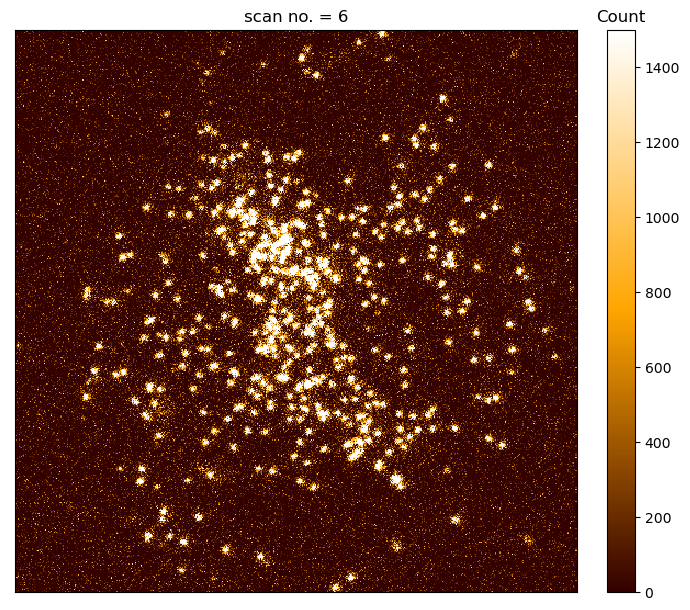

In [29]:
trans_index_1 = 6
vmax = 1500
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]


fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_list[trans_index_1], cmap=cmap_spiral2,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("scan no. = %d"%(trans_index_1))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

Text(0.5, 1.0, 'Count')

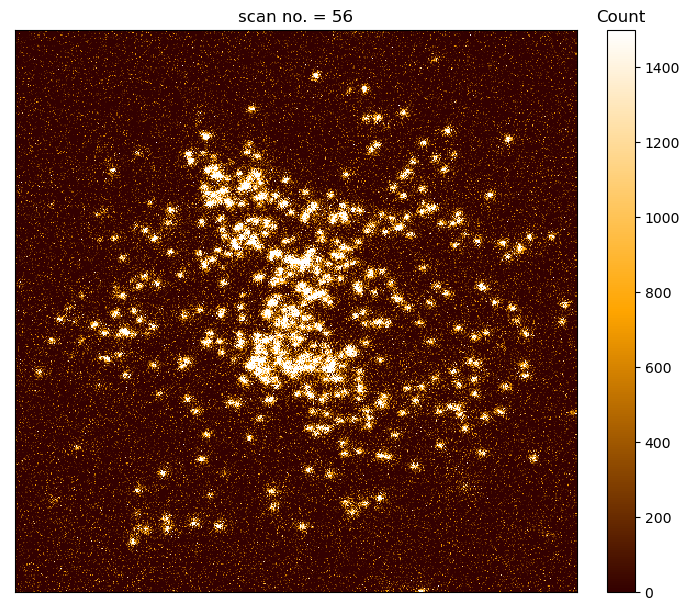

In [30]:
trans_index_2 =56
vmax = 1500
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]


fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_list[trans_index_2], cmap=cmap_spiral2,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("scan no. = %d"%(trans_index_2))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

In [31]:
img_trans_ave_list.append(img_trans_ave)
img_trans_single_list.append(np.array([img_trans_list[trans_index_1], img_trans_list[trans_index_2]]))

# Mott Insulator

In [32]:
dataNo = 7
scanNo = 8
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [33]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

img_flat_ave =[]
img_trans_ave = []
img_trans_list = []
for N in range(len(trans_files)):
    img_flat_ave += [np.array(Image.open(flat_files[N]))]
    img_trans_ave += [np.array(Image.open(trans_files[N]))]
img_flat_ave = np.average(img_flat_ave,axis=0)
img_trans_ave =np.average(img_trans_ave,axis=0) -img_flat_ave
for N in range(len(trans_files)):
    img_trans_list += [np.array(Image.open(trans_files[N])) - img_flat_ave]

Text(0.5, 1.0, 'Count')

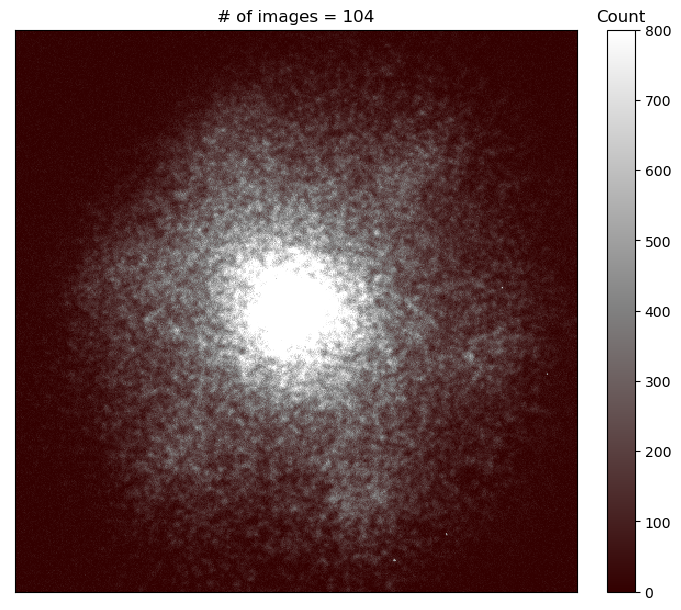

In [34]:
vmin = 0
vmax = 800
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]

fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_ave, cmap=cmap_MI,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("# of images = %d"%(len(img_trans_list)))
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

Text(0.5, 1.0, 'Count')

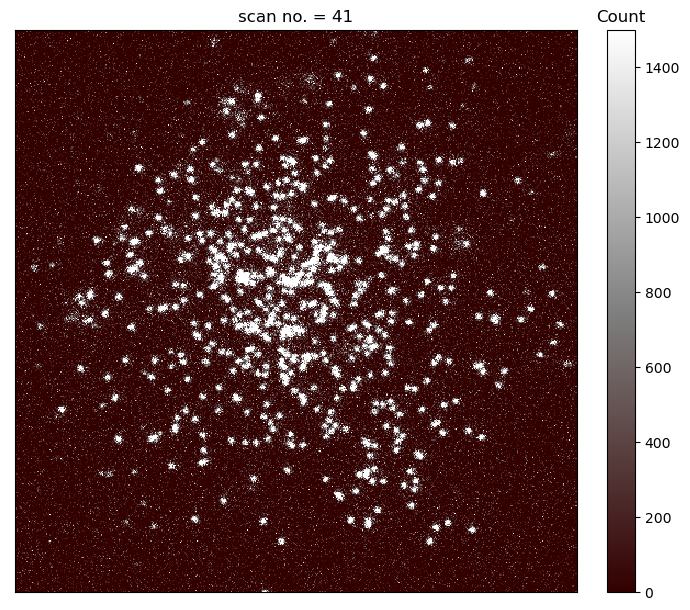

In [35]:
trans_index = 41
vmax = 1500
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]


fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_list[trans_index], cmap=cmap_MI,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("scan no. = %d"%(trans_index))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

In [36]:
img_trans_ave_list.append(img_trans_ave)
img_trans_single_list.append(img_trans_list[trans_index])

# Spiral 1

In [37]:
dataNo = 10
scanNo = 11
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [38]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

img_flat_ave =[]
img_trans_ave = []
img_trans_list = []
for N in range(len(trans_files)):
    img_flat_ave += [np.array(Image.open(flat_files[N]))]
    img_trans_ave += [np.array(Image.open(trans_files[N]))]
img_flat_ave = np.average(img_flat_ave,axis=0)
img_trans_ave =np.average(img_trans_ave,axis=0) -img_flat_ave
for N in range(len(trans_files)):
    img_trans_list += [np.array(Image.open(trans_files[N])) - img_flat_ave]

Text(0.5, 1.0, 'Count')

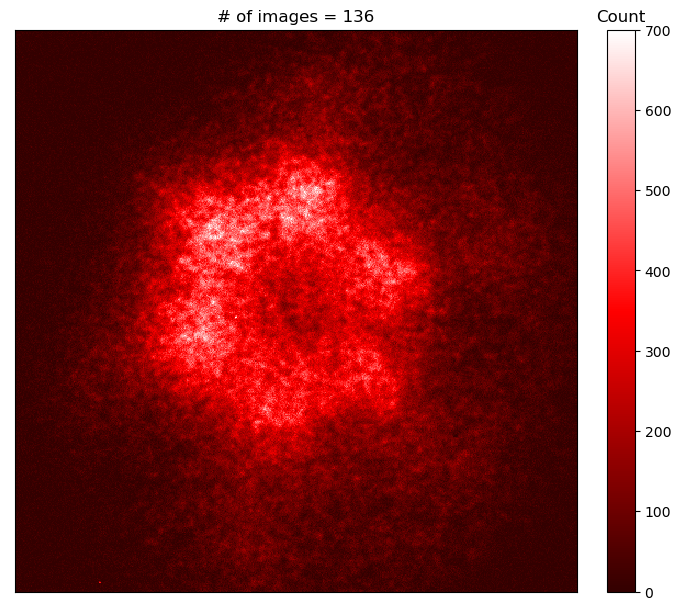

In [39]:
vmin = 0
vmax = 700
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]

fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_ave, cmap=cmap_Spiral1,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("# of images = %d"%(len(img_trans_list)))
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

Text(0.5, 1.0, 'Count')

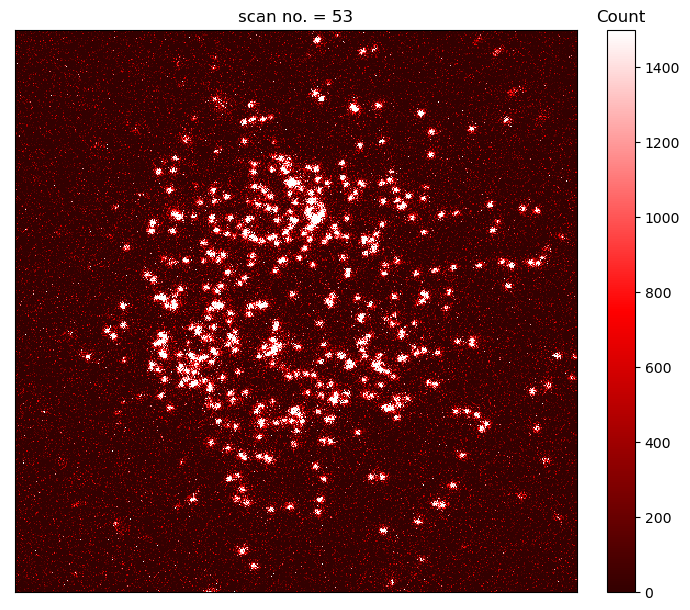

In [40]:
# trans_index_1 = 46
trans_index_1 = 53
vmax = 1500
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]


fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_list[trans_index_1], cmap=cmap_Spiral1,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("scan no. = %d"%(trans_index_1))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

Text(0.5, 1.0, 'Count')

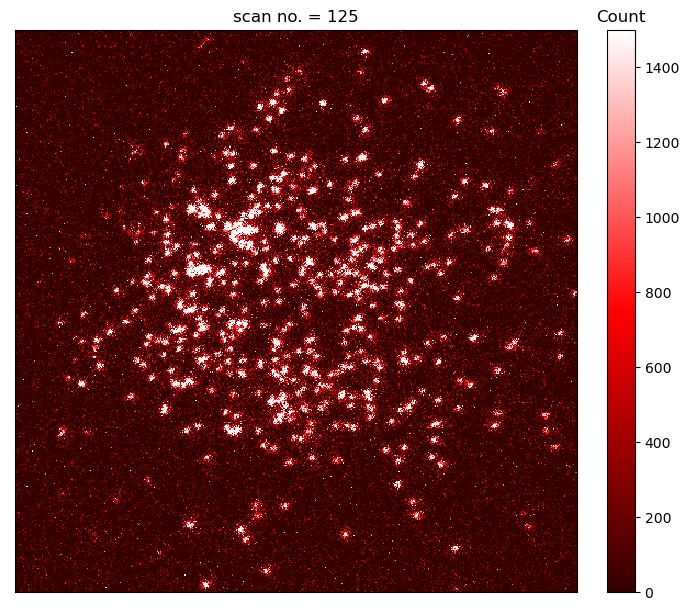

In [41]:
trans_index_2 = 125
vmax = 1500
xlim_1 = 0
xlim_2 = np.shape(img_trans_ave)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_ave)[1]


fig =plt.figure(figsize=[8,8],dpi=100,facecolor="white")
ax1 = fig.add_subplot(1,1,1)
mappable =ax1.pcolormesh(img_trans_list[trans_index_2], cmap=cmap_Spiral1,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("scan no. = %d"%(trans_index_2))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
divider1 = make_axes_locatable(ax1)
ax_cb1 = divider1.append_axes("right",size="5%",pad=0.3)
pp=fig.colorbar(mappable,cax=ax_cb1)
pp.ax.set_title(r"Count", fontsize=12)

In [42]:
img_trans_ave_list.append(img_trans_ave)
img_trans_single_list.append(np.array([img_trans_list[trans_index_1], img_trans_list[trans_index_2]]))

# Summary

In [43]:
cmap_list = [cmap_ferro,cmap_1Dchain,cmap_Rhombic,cmap_Staggered1Dchain,cmap_spiral2,cmap_MI,cmap_Spiral1]
name_list = ["Ferro","1D chains", "Rhombic", "Staggered 1D chains","Spiral 2", "MI", "Spiral 1"]
vmax_list = 1*np.array([1e3, 1e3, 0.8e3, 0.8e3,1e3,1e3, 0.8e3])

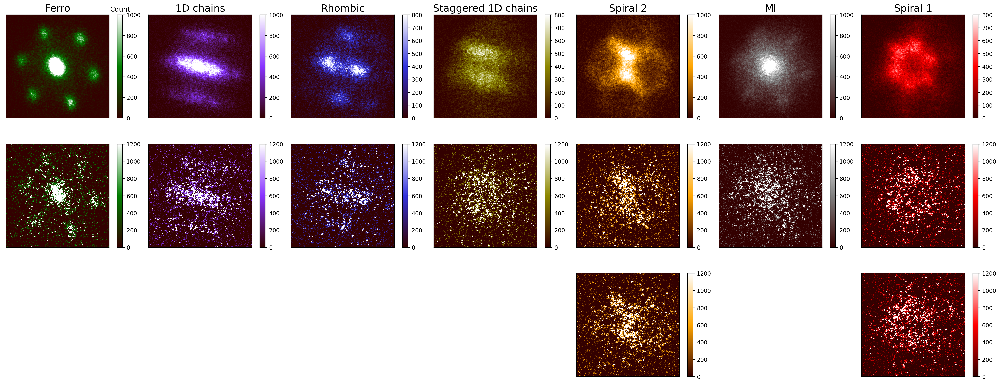

In [44]:
phase_number = 7
vmin = 0
vmax_single = 1200
fig =plt.figure(figsize=[25,10],dpi=200)
for i in range(phase_number):
    ax1 = fig.add_subplot(3,phase_number,i+1)
    mappable =ax1.pcolormesh(img_trans_ave_list[i], cmap=cmap_list[i],vmin=vmin, vmax=vmax_list[i], shading='auto')
    ax1.set_aspect('equal')
    ax1.set_xlim(xlim_1,xlim_2)
    ax1.set_ylim(ylim_1,ylim_2)
    ax1.set_title(name_list[i], fontsize=18)
    # ax1.set_xlabel("x (pixel)")
    # ax1.set_ylabel("y (pixel)")
    ax1.xaxis.set_visible(False)
    ax1.yaxis.set_visible(False)
    divider1 = make_axes_locatable(ax1)
    ax_cb1 = divider1.append_axes("right",size="5%",pad=0.2)
    pp=fig.colorbar(mappable,cax=ax_cb1)
    if i == 0:
        pp.ax.set_title(r"Count")

    ax2 = fig.add_subplot(3,phase_number,i+phase_number+1)
    ax2.set_aspect('equal')
    ax2.set_xlim(xlim_1,xlim_2)
    ax2.set_ylim(ylim_1,ylim_2)
    ax2.xaxis.set_visible(False)
    ax2.yaxis.set_visible(False)
    if np.size(np.shape(img_trans_single_list[i])) ==2:
        mappable =ax2.pcolormesh(img_trans_single_list[i], cmap=cmap_list[i],vmin=vmin, vmax=vmax_single, shading='auto')
    elif np.size(np.shape(img_trans_single_list[i])) ==3:
        mappable =ax2.pcolormesh(img_trans_single_list[i][0], cmap=cmap_list[i],vmin=vmin, vmax=vmax_single, shading='auto')
    divider2 = make_axes_locatable(ax2)
    ax_cb2 = divider2.append_axes("right",size="5%",pad=0.2)
    pp=fig.colorbar(mappable,cax=ax_cb2)
    # pp.ax.set_title(r"Count")

    
    if np.size(np.shape(img_trans_single_list[i])) ==3:
        ax3 = fig.add_subplot(3,phase_number,i+2*phase_number+1)
        ax3.set_aspect('equal')
        ax3.set_xlim(xlim_1,xlim_2)
        ax3.set_ylim(ylim_1,ylim_2)
        ax3.xaxis.set_visible(False)
        ax3.yaxis.set_visible(False)
        mappable =ax3.pcolormesh(img_trans_single_list[i][1], cmap=cmap_list[i],vmin=vmin, vmax=vmax_single, shading='auto')
        divider3 = make_axes_locatable(ax3)
        ax_cb3 = divider3.append_axes("right",size="5%",pad=0.2)
        pp=fig.colorbar(mappable,cax=ax_cb3)
        # pp.ax.set_title(r"Count")

plt.tight_layout()